## Import Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
from moviepy.editor import VideoFileClip
from PIL import Image, ImageDraw, ImageFont
%matplotlib inline

## Utility functions

In [2]:
def showResultImages(idx, img1, img2, title1 = 'Original Image', title2 = "Result", cmap1="BrBG", cmap2="BrBG") :
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img1, cmap=cmap1)
    ax1.set_title(title1 + " " + str(idx), fontsize=40)

    ax2.imshow(img2, cmap=cmap2)
    ax2.set_title(title2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
def frange(x, y, jump) :
    while x <= y : 
        yield x
        x += jump

## Calculate camera calibrate parameter 

In [3]:
print("Calculating...")
nx = 9
ny = 6

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)


imgpoints = []
objpoints = []

for i in range(1, 20) : 
    testImg = mpimg.imread('camera_cal/calibration' + str(i) + '.jpg')
    gray = cv2.cvtColor(testImg, cv2.COLOR_RGB2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # Draw and display the corners
        objpoints.append(objp)
        imgpoints.append(corners)

print("Camera Calibrate Parameters have been calculated")
        

Calculating...
Camera Calibrate Parameters have been calculated


# Distort calibration images to verify

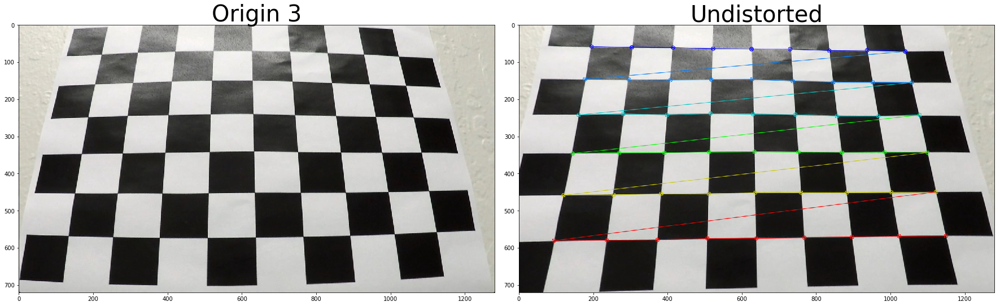

In [4]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return (mtx, dist, dst)
   

plt.figure()

i = 3
testImg = mpimg.imread('camera_cal/calibration' + str(i) + '.jpg')
mtx, dist, undistorted = cal_undistort(testImg, objpoints, imgpoints)
ret, corners = cv2.findChessboardCorners(undistorted, (nx, ny), None)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(testImg)
ax1.set_title("Origin " + str(i), fontsize=40)

cv2.drawChessboardCorners(undistorted, (nx, ny), corners, ret)
ax2.imshow(undistorted, cmap='gray')
ax2.set_title("Undistorted", fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



# Undistort test images

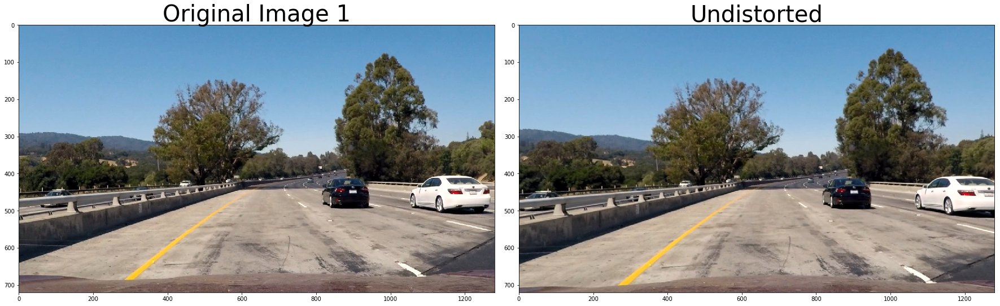

In [5]:
plt.figure()

rawImages = []
processedImages = []

displayed = False
for i in range(1, 9) : 
    testImg = mpimg.imread('test_images/test' + str(i) + '.jpg')
    rawImages.append(testImg)
    mtx, dist, undistorted = cal_undistort(testImg, objpoints, imgpoints)
    if not displayed :
        showResultImages(i, testImg, undistorted, title2="Undistorted")
        displayed = True
    processedImages.append(testImg)
    
w, h = rawImages[0].shape[1], rawImages[0].shape[0]    

    

## Show red lines

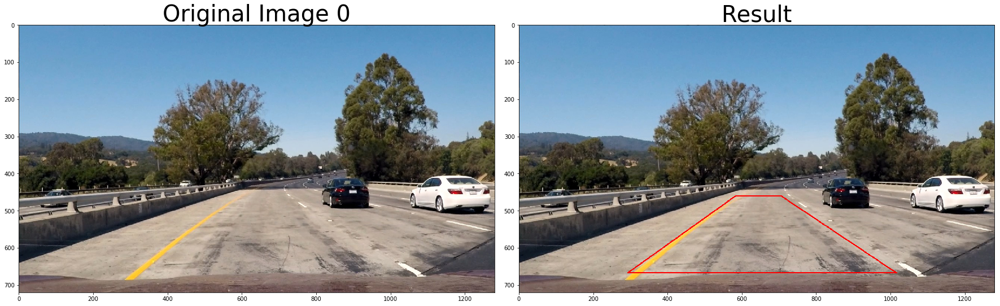

In [6]:
fourPoints = [(582, 460), (705, 460), (1015, 667), (292, 667)]

def drawBorder(img, fourPoints = [(582, 460), (705, 460), (1015, 667), (292, 667)]) :
    color = (255, 0, 0)
    cv2.line(img,fourPoints[0], fourPoints[1],color,2)
    cv2.line(img,fourPoints[1], fourPoints[2],color,2)
    cv2.line(img,fourPoints[2], fourPoints[3],color,2)
    cv2.line(img,fourPoints[0], fourPoints[3],color,2)

redLineImages = []

i = 0
newImg = rawImages[i].copy()
drawBorder(newImg, fourPoints)
showResultImages(i, rawImages[i], newImg)


## Perspective Transform

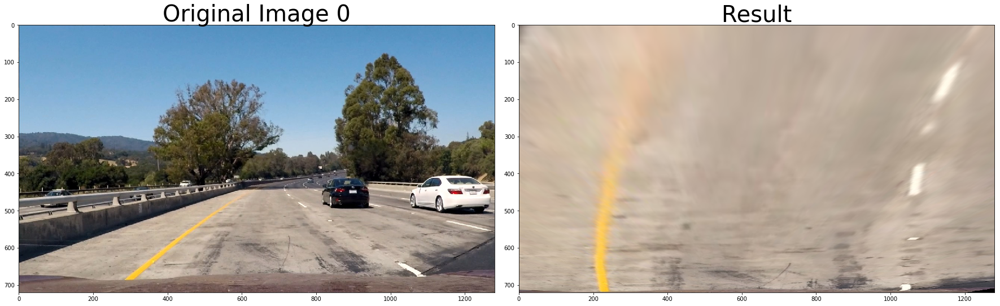

In [7]:
offsetLeft = 200
offsetRight = 300
offsetTop = 200
offsetBottom = 10
    
w, h = processedImages[0].shape[1], processedImages[0].shape[0]

fourPoints = [(582, 460), (705, 460), (1015, 667), (292, 667)]
src = np.float32(fourPoints)
dst = np.float32([[offsetLeft, offsetTop], [w - offsetRight, offsetTop],[w - offsetRight, h - offsetBottom], [offsetLeft, h - offsetBottom]])


M = cv2.getPerspectiveTransform(src, dst)
MinV = cv2.getPerspectiveTransform(dst, src)

i = 0
warppedImages = []
displayed = False
for img in processedImages :
    warpped = cv2.warpPerspective(img, M, (w, h))
    if not displayed :
        showResultImages(i, img, warpped, cmap1="gray", cmap2="gray")
        displayed = True
    warppedImages.append(warpped)
    i = i + 1

## Apply gradient

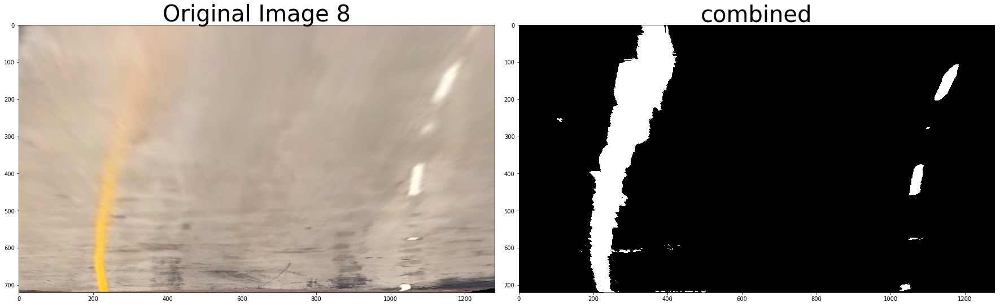

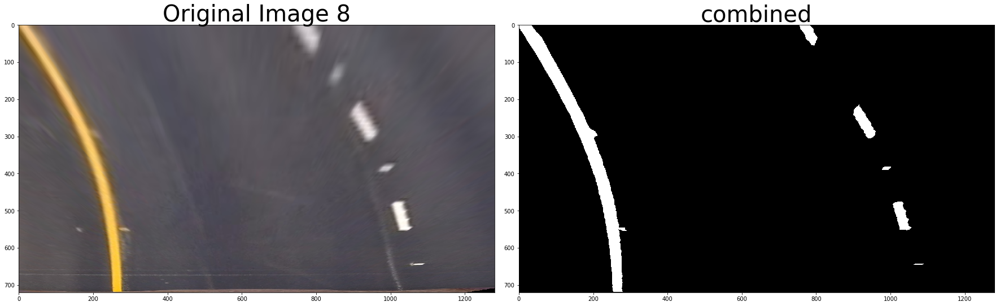

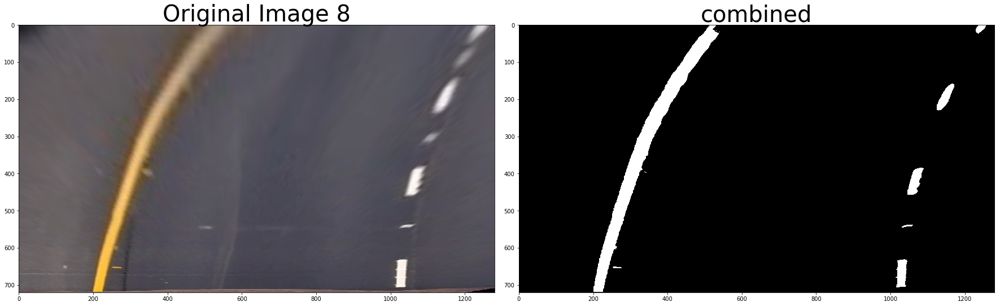

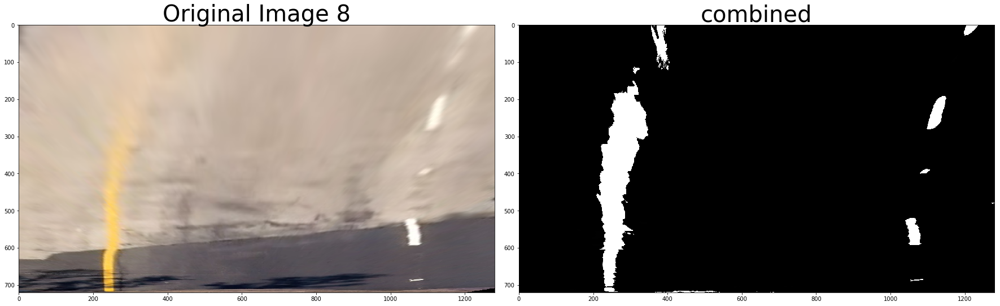

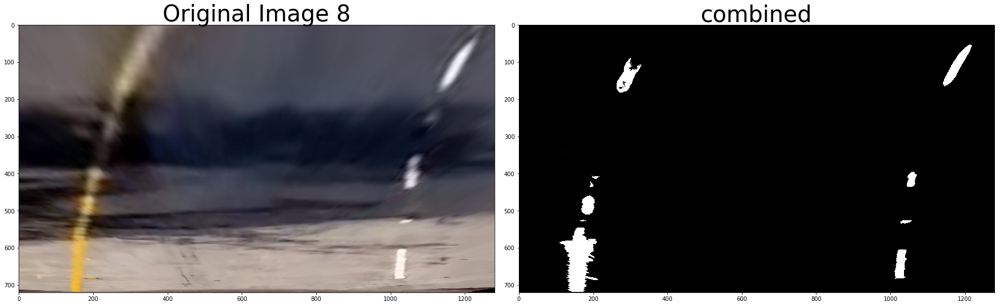

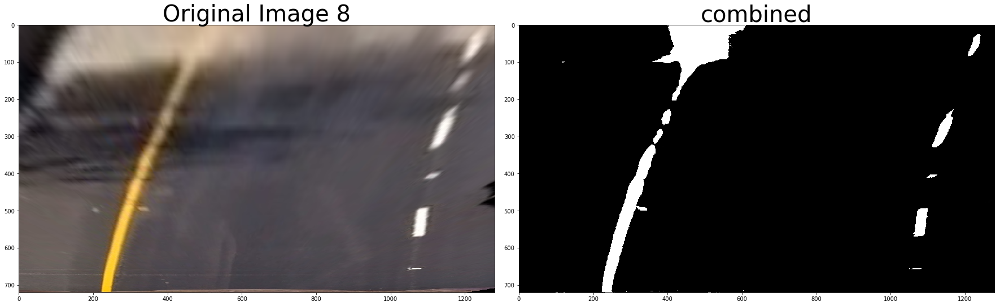

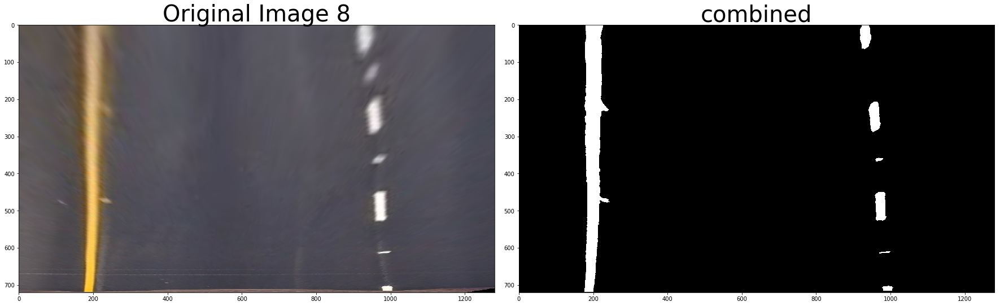

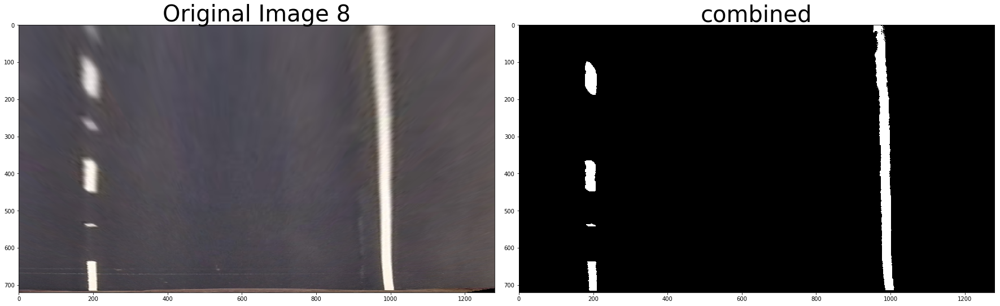

In [8]:
def handleGradient2(img):
    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
 
    s_thresh_min = 175
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min)] = 1
    
    l_thresh_min = 210
    l_binary = np.zeros_like(l_channel)
    l_binary[l_channel >= l_thresh_min] = 1

    combined_binary = np.zeros_like(s_binary)
    combined_binary[((l_binary == 1) | (s_binary == 1))] = 1
    return combined_binary

def handleGradient(img) :
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]

    l_thresh_min = 225
    l_binary = np.zeros_like(l_channel)
    l_binary[l_channel >= l_thresh_min] = 1

    
    # For yellow
    yellow = cv2.inRange(HSV, (0, 60, 150), (60, 255, 255))

    # For white
    sensitivity_1 = 68
    white = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

    sensitivity_2 = 40
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))
    white_3 = cv2.inRange(img, (200,200,200), (255,255,255))
    
    bit_layer = np.zeros_like(img[:,:,2])
    bit_layer = handleGradient2(img) | yellow | white | white_2 | white_3
    return bit_layer

gradiatedImages = []
displayed = False    
for img in warppedImages :
    #img = warppedImages[4]
    resultImg = handleGradient(img)

    if not displayed :
        showResultImages(i, img, resultImg, title2 = "combined", cmap2="gray")
        #displayed = True
    gradiatedImages.append(resultImg)

    

    

## Show Histogram

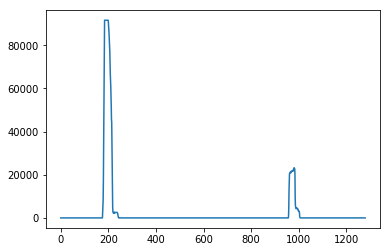

In [9]:
import numpy as np
img = gradiatedImages[6]
histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
plt.plot(histogram)

## Find Lines

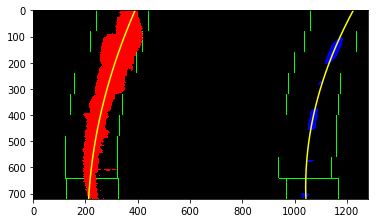

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def find_lines(binary_warped) :
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    plt.figure()
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    return out_img

displayed = False
for img in gradiatedImages :
    if not displayed :
        find_lines(img)
        displayed = True



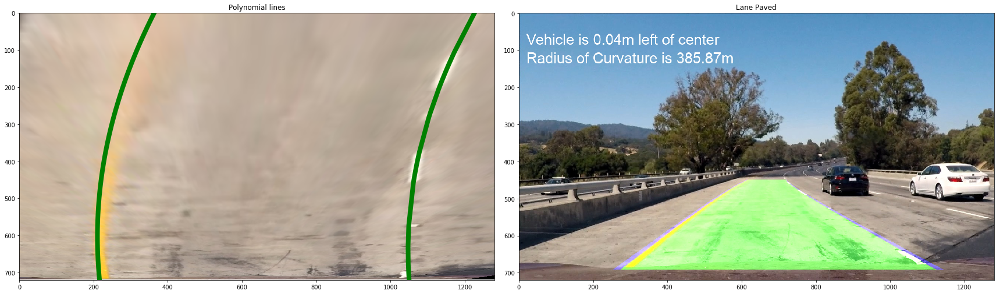

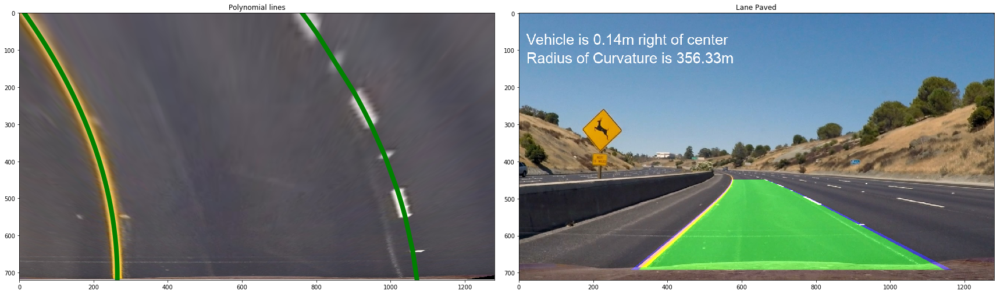

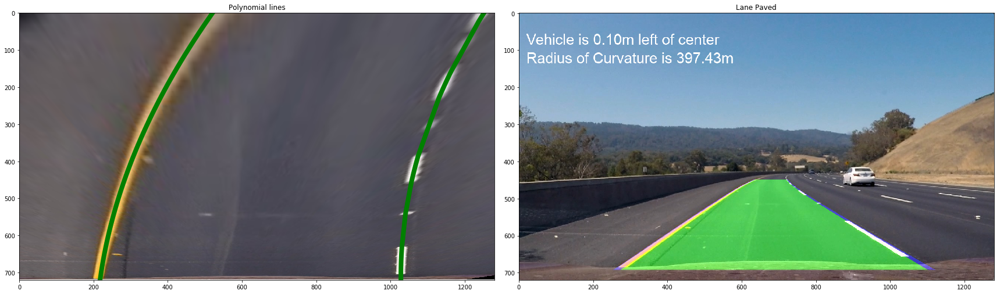

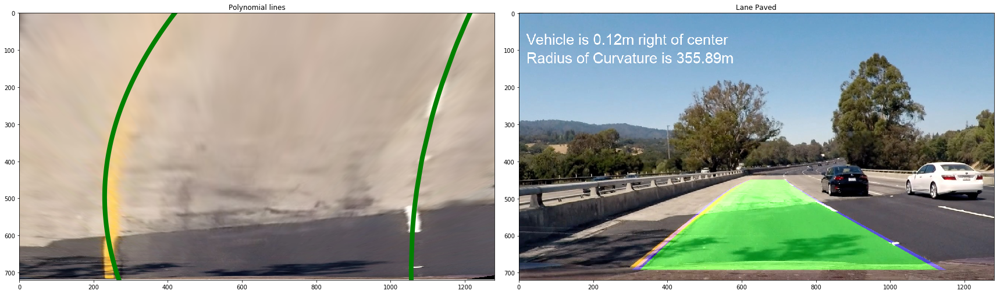

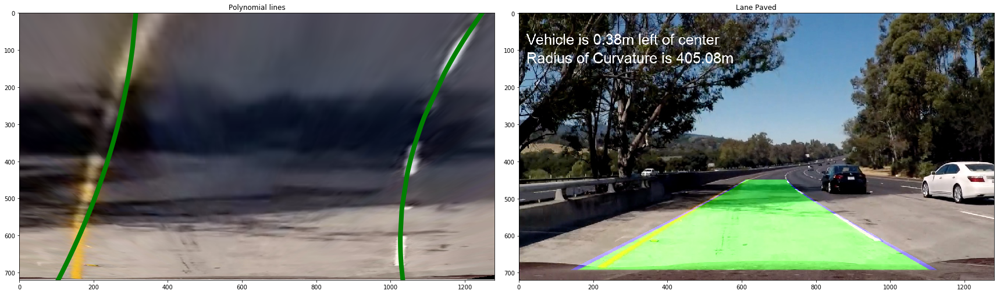

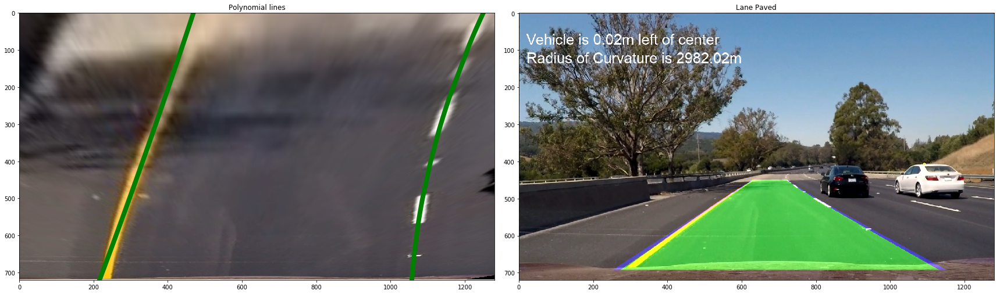

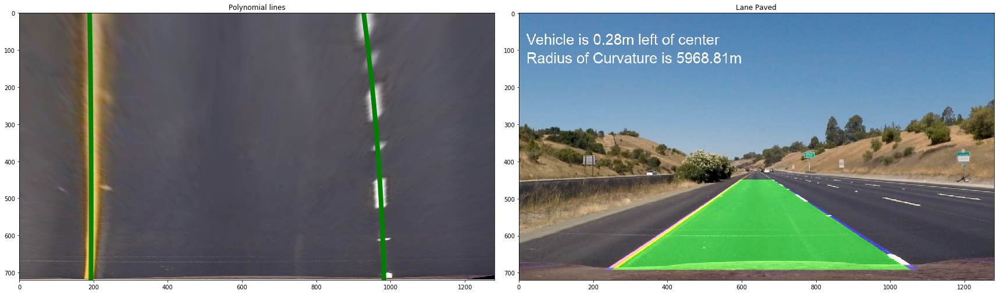

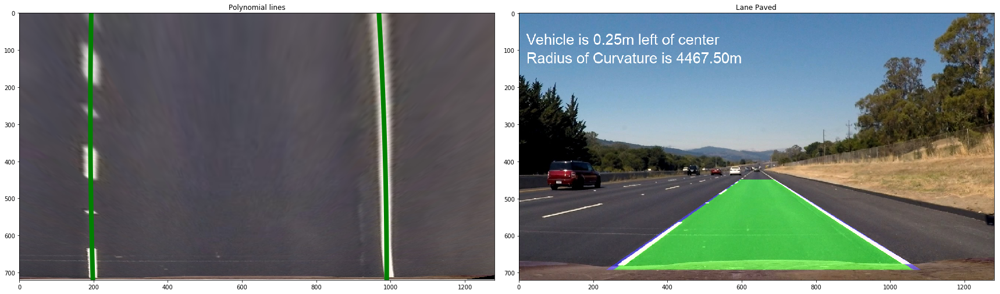

In [23]:
# Measure Radius of Curvature for each lane line
ym_per_pix = 30./720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension
img_size = (h, w)
blue = (0, 0, 255)
green = (0, 255, 0)
markSize = 8
oldWarp = None
count = 1
textFontSize = 40

def calcWindow(hist, arr, x, y, i, j, offset = 0) : 
    range = 25
    peak = np.argmax(hist) + offset
    idx =  np.where((((peak - range) < x)&(x < (peak + range))&((y > j) & (y < i))))
    x_window, y_window = x[idx], y[idx]
    if np.sum(x_window) != 0:
        arr[0].extend(x_window.tolist())
        arr[1].extend(y_window.tolist())

def calcCurvature(arr) :
    arry = np.array(arr[1]).astype(np.float32)
    arrx = np.array(arr[0]).astype(np.float32)
    
    arr_fit = np.polyfit(arry, arrx, 2)
    arr_fitx = arr_fit[0] * arry ** 2 + arr_fit[1] * arry + arr_fit[2]
    
    y_eval = max(arry) / 2  * ym_per_pix # max plot / 2 then convert to meters
    
    
    arr_fit_cr = np.polyfit(arry*ym_per_pix, arrx*xm_per_pix, 2)
    arr_curverad = ((1 + (2*arr_fit_cr[0]*y_eval*ym_per_pix + arr_fit_cr[1])**2)**1.5) / np.absolute(2*arr_fit_cr[0])

    
    #arr_curverad = ((1 + (2*arr_fit[0]*y_eval + arr_fit[1])**2)**1.5) / np.absolute(2*arr_fit[0])
    
    arrx_int = arr_fit[0] * h ** 2 + arr_fit[1] * h  + arr_fit[2]
    arrx = np.append(arrx, arrx_int)
    arry = np.append(arry, h)
    arrx = np.append(arrx, arr_fit[2])
    arry = np.append(arry, 0)
    lsort = np.argsort(arry)
    arry = arry[lsort]
    arrx = arrx[lsort]
    arr_fit = np.polyfit(arry, arrx, 2)
    arr_fitx = arr_fit[0] * arry ** 2 + arr_fit[1] * arry + arr_fit[2]
    
    #print(y_eval, arr_fit[0], arr_fit[1], arr_curverad)
    return arry, arrx_int, arr_fitx, arr_fit, arr_curverad

def displayLane(backgroundImage, result, left_fitx, right_fitx, lefty, righty) :
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(24, 16))
    f.tight_layout()
    ax1.imshow(backgroundImage)
    ax1.set_xlim(0, w)
    ax1.set_ylim(0, h)
    ax1.plot(left_fitx, lefty, color='green', linewidth = markSize)
    ax1.plot(right_fitx, righty, color='green', linewidth = markSize)
    ax1.set_title('Polynomial lines')
    ax1.invert_yaxis() 
    ax2.imshow(result)
    ax2.set_title('Lane Paved')
    
def decorateResultImage(result, center, left_curverad, right_curverad) :
    direction = "left" if center > 0 else "right" 
    distance = round(abs(center)*3.7/700, 2)
    centerDistance = (left_curverad + right_curverad) / 2
    
    img = Image.fromarray(result)
    draw = ImageDraw.Draw(img)
    
    fnt = ImageFont.truetype("Arial.ttf", textFontSize)
    
    draw.text((20, 50), 'Vehicle is {0:.2f}m '.format(distance) + direction + ' of center', font = fnt)
    draw.text((20, 100), 'Radius of Curvature is {0:.2f}m'.format(centerDistance), font = fnt)
    result = np.asarray(img)
    del draw
    return result
    
def calcMatch(colorImg1, colorImg2) :
    img1 = cv2.cvtColor(colorImg1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(colorImg2, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(img1, 127, 255,0)
    ret, thresh2 = cv2.threshold(img2, 127, 255,0)
    
    im2, contours1, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    cnt1 = contours1[0]
    im2, contours2, hierarchy = cv2.findContours(thresh2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    cnt2 = contours2[0]
    return cv2.matchShapes(cnt1,cnt2,1,0.0)
    
def fill_lane(rawImage, resultImage, backgroundImage, isTesting = False):
    global oldWarp
    global count 
    left = [[], []]
    right =[[], []]
    
    x, y = np.nonzero(np.transpose(resultImage))
    midx = w // 2
    step = -10
    
    for i, j in zip(range(h, 0, step), range(midx, 0, step)):
        histogram = np.sum(resultImage[j : i, :], axis=0)     
        calcWindow(histogram[ : midx], left, x, y, i, j)
        calcWindow(histogram[midx :], right, x, y, i, j, midx)

    lefty, leftx_int, left_fitx, left_fit, left_curverad = calcCurvature(left)  
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    
    righty, rightx_int, right_fitx, right_fit, right_curverad = calcCurvature(right) 
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    
    pts = np.hstack((pts_left, pts_right))
    
    # calculate the vehicle position, negative means left, positive means right
    center = midx - (rightx_int + leftx_int)//2
    
    warp_zero = np.zeros_like(resultImage).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=blue, thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), green)
    
    if isTesting or oldWarp == None :
        oldWarp = color_warp
        count = 1
    
    if calcMatch(oldWarp, color_warp) < 0.045 * count :
        oldWarp = color_warp
        count = 1
    else : 
        count = min(count + 0.05, 4)
    
    newwarp = cv2.warpPerspective(oldWarp, MinV, (w, h))
    result = cv2.addWeighted(rawImage, 1, newwarp, 0.5, 0)
    
    result = decorateResultImage(result, center, left_curverad, right_curverad)
    
    if isTesting :
        displayLane(backgroundImage, result, left_fitx, right_fitx, lefty, righty)
    return result

for i in range(0, 8) :
    img = fill_lane(rawImages[i], gradiatedImages[i], warppedImages[i], True)


## Orchestrate method

In [24]:

def process_image(testImg) :

    mtx, dist, undistorted = cal_undistort(testImg, objpoints, imgpoints)
    warppedImg = cv2.warpPerspective(undistorted, M, (w, h))
    gradiantImg = handleGradient(warppedImg)
    resultImg = fill_lane(testImg, gradiantImg, warppedImg)
    
    return resultImg



## Calling from video

In [25]:
from moviepy.editor import VideoFileClip
name = "project"
project_output = 'output_images/' + name + '_output.mp4'
clip1 = VideoFileClip(name + '_video.mp4')
oldWarp = None
count = 1
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video output_images/project_output.mp4
[MoviePy] Writing video output_images/project_output.mp4


100%|█████████▉| 1260/1261 [37:22<00:01,  1.64s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_output.mp4 

CPU times: user 37min 26s, sys: 1min, total: 38min 26s
Wall time: 37min 23s
